###The purpose of this notebook is to compare trees constructed using different alignment pruning parameters###

In [6]:
sequences=open("./no_nahant/casjens_terminases.aln.fasta").read().replace("*","")

In [5]:
import os
os.chdir("./no_nahant/")

In [23]:
from skbio import Alignment, Protein

from matplotlib import cm
import matplotlib.pyplot as plt
%matplotlib inline
import numpy as np

aln=Alignment.read("casjens_terminases.aln.fasta", constructor=Protein)

In [44]:
from skbio.alignment import Alignment
from skbio.sequence import Protein
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np
from itolapi import Itol, ItolExport
from IPython.display import Image
%matplotlib inline

In [32]:
aln=Alignment.read(file="casjens_terminases.aln.fasta", format="fasta", constructor=Protein)

In [31]:
aln

<Alignment: n=199; mean +/- std length=1435.00 +/- 0.00>

####Checking out the entropies for positions within this alignment, filtering out positions that have entropies less than 0.85:

In [33]:
entropies=aln.position_entropies(base=21)
entropy_filtered_aln = aln.subalignment(positions_to_keep=[i for i, e in enumerate(entropies) if 0.0 < e <= 0.85])
entropy_filtered_aln

This alignment has high entropy... most positions have an entropy greater than 0.85 which is not ideal; only 37 positions wre maintained after filtering. The original alignment had a length of 1435.

Next checking for gaps:

In [35]:
gap_freq=[d["-"] for d in aln.position_frequencies()]

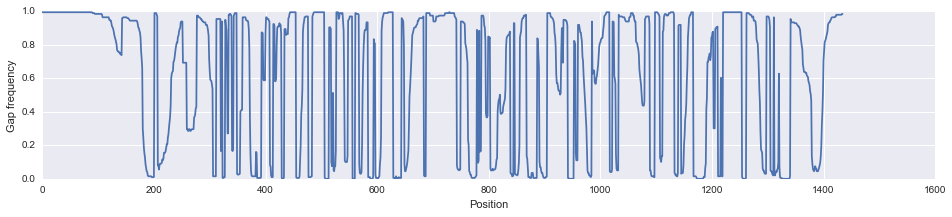

In [36]:
fig, ax = plt.subplots()
fig.set_size_inches([16,3])
ax.plot(np.arange(len(gap_freq)), gap_freq)
ax.set_xlabel("Position")
ax.set_ylabel("Gap frequency")

Alignment has a number of positions with mostly gaps.  What if all gaps were filtered out:

In [55]:
gap_thresh=0
keepers, = np.where(np.array(gap_freq)<=gap_thresh)
aln_masked = aln.subalignment(positions_to_keep=keepers)
gap_freq2=[d["-"] for d in aln_masked.position_frequencies()]
print(len(gap_freq2))

63


Only 63 positions that do not have a gap in at least one sequence.

I want to look at trees created with both of these extreme cases.  One case where only "low entropy" positions are considered, and one where only positions without gaps are considered.

I also want to consider a tree that uses more sequence information, even if gaps exist:

483


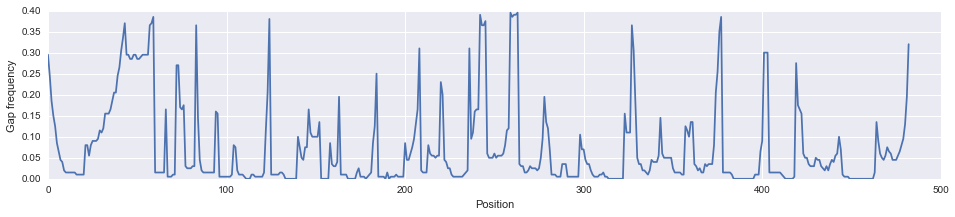

In [64]:
gap_thresh=0.40
keepers, = np.where(np.array(gap_freq)<=gap_thresh)
aln_masked2 = aln.subalignment(positions_to_keep=keepers)
gap_freq3=[d["-"] for d in aln_masked2.position_frequencies()]
print(len(gap_freq3))
fig, ax = plt.subplots()
fig.set_size_inches([16,3])
ax.plot(np.arange(len(gap_freq3)), gap_freq3)
ax.set_xlabel("Position")
ax.set_ylabel("Gap frequency")

In [58]:
entropy_filtered_aln.write("casjens_terminases.low_entropy_aln.fasta", format="fasta")
aln_masked.write("casjens_terminases.no_gap.aln.fasta", format="fasta")
aln_masked2.write("casjens_terminases.aln.masked_.40_gaps.fasta", format="fasta")

'casjens_terminases.aln.masked_.40_gaps.fasta'

In [59]:
%%bash
fasttree <casjens_terminases.low_entropy_aln.fasta> casjens_terminases.low_entropy_aln.tree
fasttree <casjens_terminases.no_gap.aln.fasta> casjens_terminases.no_gap.aln.tree
fasttree <casjens_terminases.aln.masked_.40_gaps.fasta> casjens_terminases.aln.masked_.40_gaps.tree

FastTree Version 2.1.8 No SSE3
Alignment: standard input
Amino acid distances: BLOSUM45 Joins: balanced Support: SH-like 1000
Search: Normal +NNI +SPR (2 rounds range 10) +ML-NNI opt-each=1
TopHits: 1.00*sqrtN close=default refresh=0.80
ML Model: Jones-Taylor-Thorton, CAT approximation with 20 rate categories
Initial topology in 0.02 seconds
Refining topology: 30 rounds ME-NNIs, 2 rounds ME-SPRs, 15 rounds ML-NNIs
      0.10 seconds: SPR round   2 of   2, 101 of 366 nodes
Total branch-length 86.866 after 0.16 sec
      0.20 seconds: ML NNI round 1 of 15, 1 of 182 splits
      0.32 seconds: ML NNI round 1 of 15, 101 of 182 splits, 20 changes (max delta 2.526)
ML-NNI round 1: LogLk = -12042.501 NNIs 44 max delta 2.53 Time 0.42
      0.42 seconds: Site likelihoods with rate category 2 of 20
Switched to using 20 rate categories (CAT approximation)
Rate categories were divided by 1.068 so that average rate = 1.0
CAT-based log-likelihoods may not be comparable across runs
Use -gamma for appr

###Tree using only 37 low entropy positions:

In [42]:
itol_uploader = Itol.Itol()
itol_uploader.add_variable('treeFile', 'casjens_terminases.low_entropy_aln.tree')
itol_uploader.add_variable('treeFormat', 'newick')
itol_uploader.add_variable('treeName', 'ours and theirs with taxa colors')
itol_uploader.add_variable("colorDefinitionFile", "term_def.txt")

status = itol_uploader.upload()
itol_uploader.comm.upload_output
print itol_uploader.get_webpage()

http://itol.embl.de/external.cgi?tree=129981071284011114400779410&restore_saved=1


In [43]:
from itolapi import ItolExport
itol_exporter = ItolExport.ItolExport()
itol_exporter.set_export_param_value("tree", itol_uploader.comm.tree_id)
itol_exporter.set_export_param_value("format", "png")
itol_exporter.set_export_param_value("rangesCover", "clades")
itol_exporter.set_export_param_value("displayMode", "circular")
itol_exporter.export("casjens_terminase.low_entropy.png")

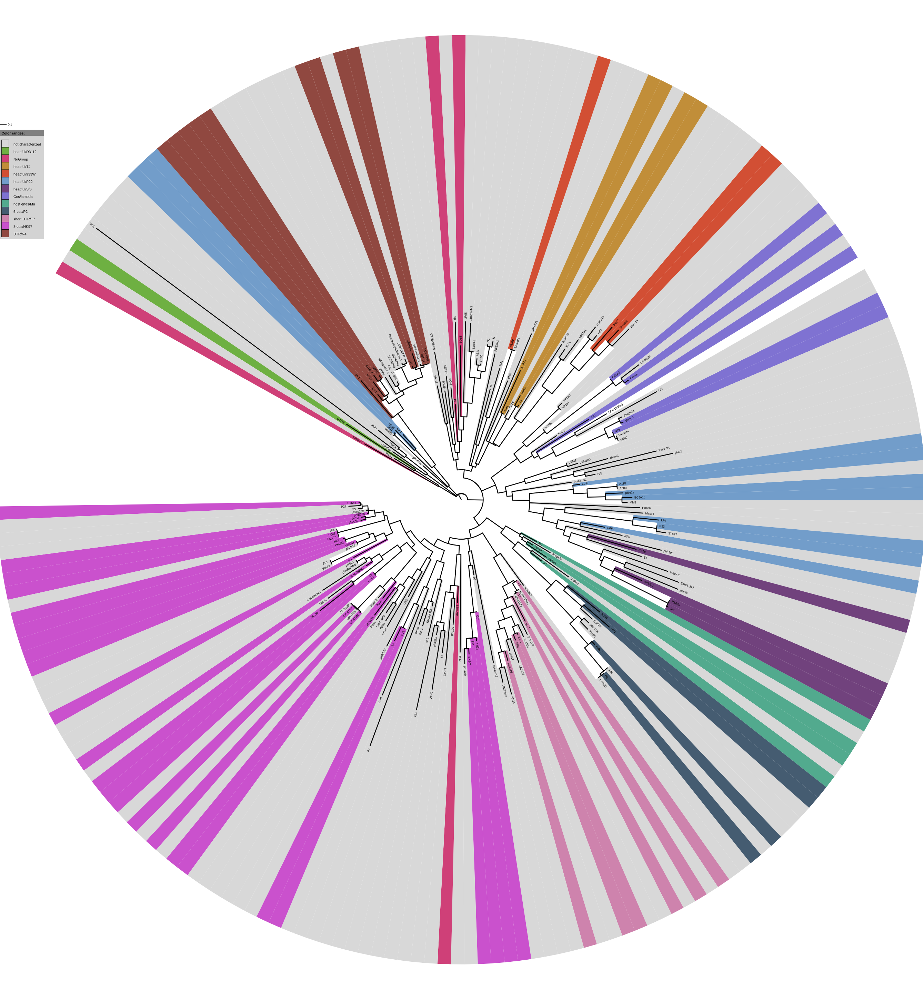

In [45]:
Image("casjens_terminase.low_entropy.png", width="800")

Despite using only 37 positions, this shape matches well with the arrangement of the tree from Casjens 2009 except for phages with headful-like terminases (light blue, dark purple, orange and yellow).  

###Next using the alignment with all gaps removed:

In [47]:
itol_uploader = Itol.Itol()
itol_uploader.add_variable('treeFile', 'casjens_terminases.no_gap.aln.tree')
itol_uploader.add_variable('treeFormat', 'newick')
itol_uploader.add_variable('treeName', 'ours and theirs with taxa colors')
itol_uploader.add_variable("colorDefinitionFile", "term_def.txt")

status = itol_uploader.upload()
itol_uploader.comm.upload_output
print itol_uploader.get_webpage()

http://itol.embl.de/external.cgi?tree=129981071284197214400784430&restore_saved=1


In [48]:
from itolapi import ItolExport
itol_exporter = ItolExport.ItolExport()
itol_exporter.set_export_param_value("tree", itol_uploader.comm.tree_id)
itol_exporter.set_export_param_value("format", "png")
itol_exporter.set_export_param_value("rangesCover", "clades")
itol_exporter.set_export_param_value("displayMode", "circular")
itol_exporter.export("casjens_terminase.no_gaps.png")

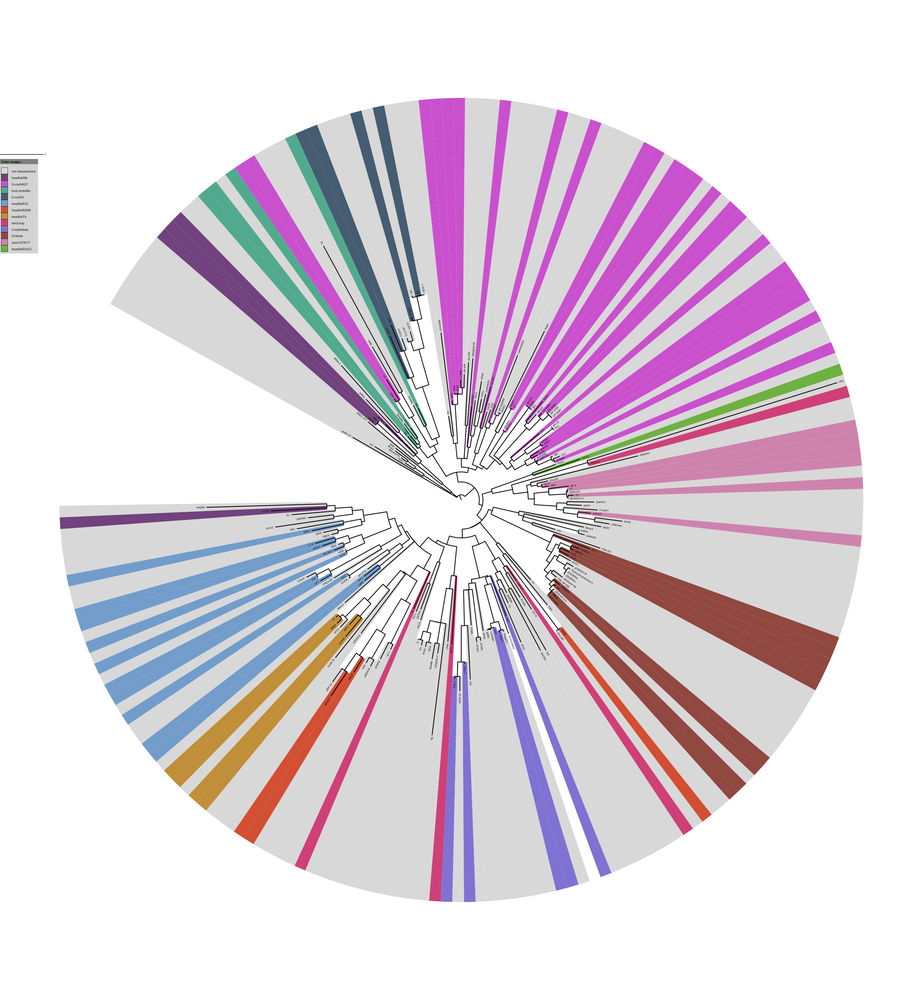

In [49]:
Image("casjens_terminase.no_gaps.png", width="800")

Shape comes out differently with this alignment.  Like the last alignment, most groups are conserved in their clustering.  The most problematic group is still the headfuls which are mostly clustering together with a few that are split up around the tree.

###Alignment with positions that are <=40% gapped:

In [60]:
itol_uploader = Itol.Itol()
itol_uploader.add_variable('treeFile', 'casjens_terminases.aln.masked_.40_gaps.tree')
itol_uploader.add_variable('treeFormat', 'newick')
itol_uploader.add_variable('treeName', 'ours and theirs with taxa colors')
itol_uploader.add_variable("colorDefinitionFile", "term_def.txt")

status = itol_uploader.upload()
itol_uploader.comm.upload_output
print itol_uploader.get_webpage()

http://itol.embl.de/external.cgi?tree=12998107128794814400810220&restore_saved=1


In [61]:
from itolapi import ItolExport
itol_exporter = ItolExport.ItolExport()
itol_exporter.set_export_param_value("tree", itol_uploader.comm.tree_id)
itol_exporter.set_export_param_value("format", "png")
itol_exporter.set_export_param_value("rangesCover", "clades")
itol_exporter.set_export_param_value("displayMode", "circular")
itol_exporter.export("casjens_terminase.40pct_gap_max.png")

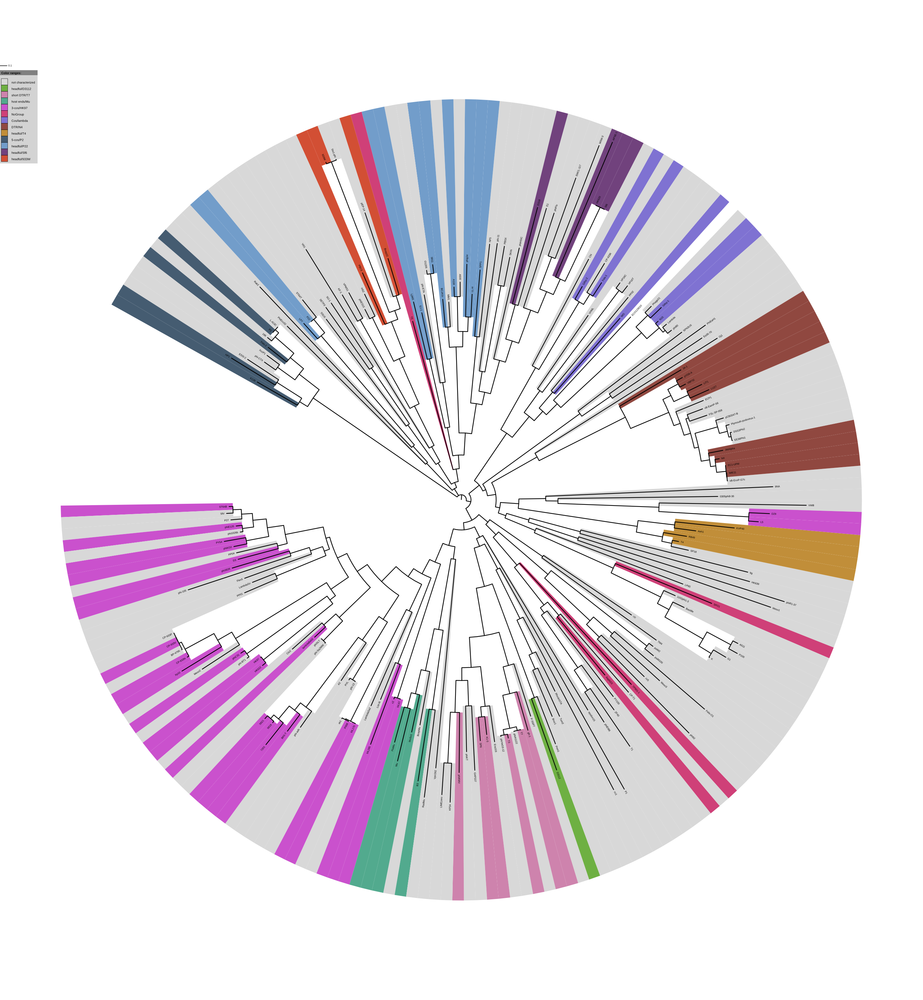

In [62]:
Image("casjens_terminase.40pct_gap_max.png", width="800")

Once again terminase types look to be conserved in the output.  Headfuls are now all falling onto the same (albeit deeply branched) clade.  I think that this approach is the best moving forward.  This tree also most closely reflects the shape of the tree in the Casjens 2009 paper.

Just out of curiosity, what if I lower the gap thresshold to 0.1?

369


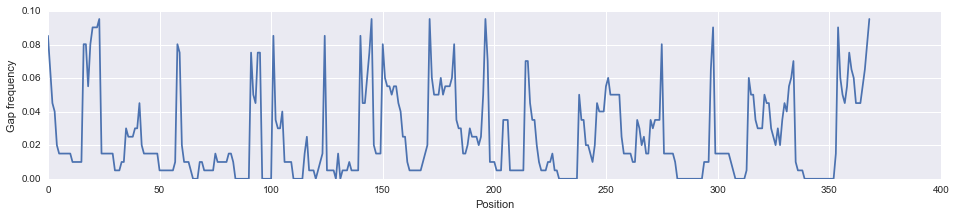

In [65]:
gap_thresh=0.10
keepers, = np.where(np.array(gap_freq)<=gap_thresh)
aln_masked2 = aln.subalignment(positions_to_keep=keepers)
gap_freq3=[d["-"] for d in aln_masked2.position_frequencies()]
print(len(gap_freq3))
fig, ax = plt.subplots()
fig.set_size_inches([16,3])
ax.plot(np.arange(len(gap_freq3)), gap_freq3)
ax.set_xlabel("Position")
ax.set_ylabel("Gap frequency")

In [67]:
aln_masked2.write("casjens_terminase.10pct_gap_max.aln.fasta",format="fasta")

'casjens_terminase.10pct_gap_max.aln.fasta'

In [68]:
%%bash
fasttree <casjens_terminase.10pct_gap_max.aln.fasta> casjens_terminase.10pct_gap_max.tree

FastTree Version 2.1.8 No SSE3
Alignment: standard input
Amino acid distances: BLOSUM45 Joins: balanced Support: SH-like 1000
Search: Normal +NNI +SPR (2 rounds range 10) +ML-NNI opt-each=1
TopHits: 1.00*sqrtN close=default refresh=0.80
ML Model: Jones-Taylor-Thorton, CAT approximation with 20 rate categories
Ignored unknown character X (seen 5 times)
Initial topology in 0.15 seconds
Refining topology: 31 rounds ME-NNIs, 2 rounds ME-SPRs, 15 rounds ML-NNIs
      0.14 seconds: ME NNI round 1 of 31, 1 of 196 splits
      0.36 seconds: SPR round   1 of   2, 101 of 394 nodes
      0.50 seconds: SPR round   1 of   2, 201 of 394 nodes
      0.66 seconds: SPR round   1 of   2, 301 of 394 nodes
      0.81 seconds: ME NNI round 11 of 31, 1 of 196 splits
      0.99 seconds: SPR round   2 of   2, 101 of 394 nodes
      1.14 seconds: SPR round   2 of   2, 201 of 394 nodes
      1.29 seconds: SPR round   2 of   2, 301 of 394 nodes
      1.43 seconds: ME NNI round 21 of 31, 1 of 196 splits
Total bra

In [69]:
itol_uploader = Itol.Itol()
itol_uploader.add_variable('treeFile', 'casjens_terminase.10pct_gap_max.tree')
itol_uploader.add_variable('treeFormat', 'newick')
itol_uploader.add_variable('treeName', 'ours and theirs with taxa colors')
itol_uploader.add_variable("colorDefinitionFile", "term_def.txt")

status = itol_uploader.upload()
itol_uploader.comm.upload_output
print itol_uploader.get_webpage()

http://itol.embl.de/external.cgi?tree=129981071281409414400822000&restore_saved=1


In [70]:
from itolapi import ItolExport
itol_exporter = ItolExport.ItolExport()
itol_exporter.set_export_param_value("tree", itol_uploader.comm.tree_id)
itol_exporter.set_export_param_value("format", "png")
itol_exporter.set_export_param_value("rangesCover", "clades")
itol_exporter.set_export_param_value("displayMode", "circular")
itol_exporter.export("casjens_terminase.10pct_gap_max.png")

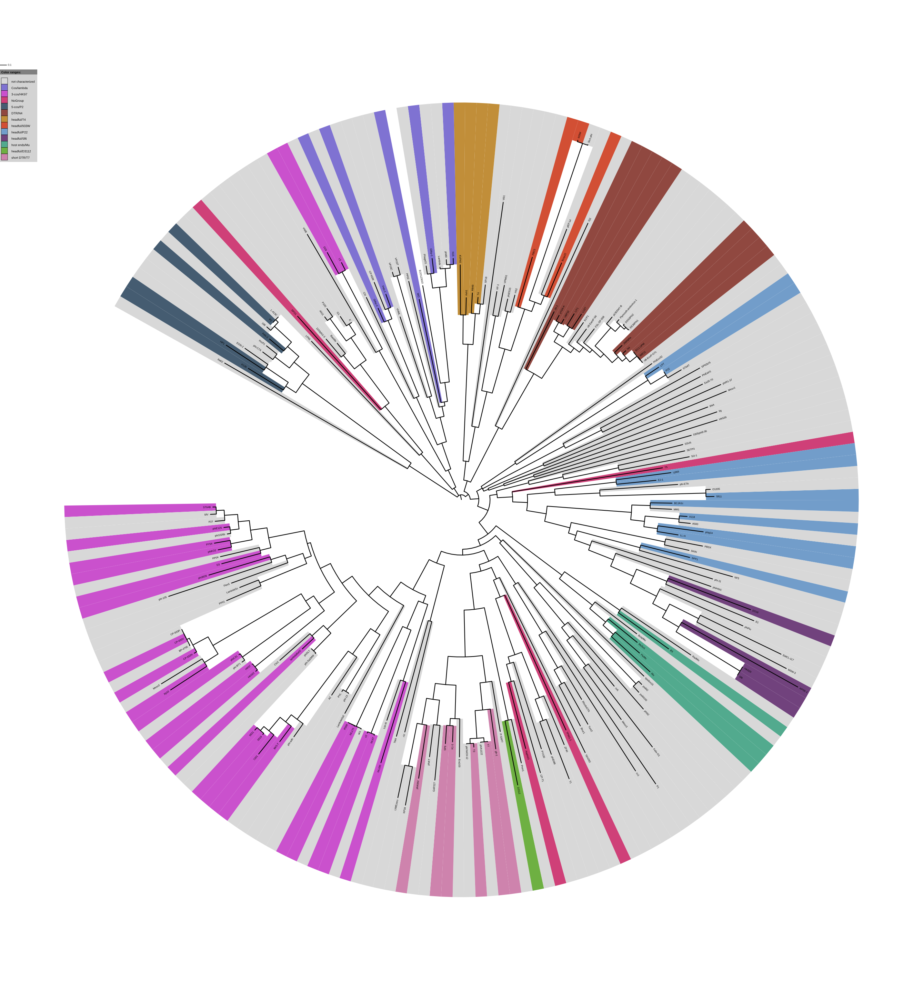

In [71]:
Image("casjens_terminase.10pct_gap_max.png", width="800")

A different clustering, again, which just means that the ancestral nodes must be collapsed.  I'm guessing the bootstrap values on those ancestral nodes are not robust.

What about UCLUST?  How do the terminases cluster based on that analysis?

In [78]:
!scp ../akmk_terminases/akmk_terminases_short_title.fasta jbrown@eofe4.mit.edu:/nobackup1/jbrown/phage_host_ntwk/protein_comparisons/kk_terminases.fasta

akmk_terminases_short_title.fasta             100%  109KB 108.6KB/s   00:00    


In [100]:
!scp ../terminase_uclust.slurm jbrown@eofe4.mit.edu:/nobackup1/jbrown/phage_host_ntwk/protein_comparisons/

terminase_uclust.slurm                        100%  716     0.7KB/s   00:00    


In [101]:
!scp jbrown@eofe4.mit.edu:/nobackup1/jbrown/phage_host_ntwk/protein_comparisons/kk_terminases*.uc ./

kk_terminases_0.1.uc                          100%   10KB  10.5KB/s   00:00    
kk_terminases_0.2.uc                          100%   10KB  10.3KB/s   00:00    
kk_terminases_0.3.uc                          100%   10KB  10.2KB/s   00:00    
kk_terminases_0.4.uc                          100%   10KB  10.1KB/s   00:00    
kk_terminases_0.5.uc                          100%   10KB   9.9KB/s   00:00    
kk_terminases_0.6.uc                          100% 9934     9.7KB/s   00:00    
kk_terminases_0.7.uc                          100% 9964     9.7KB/s   00:00    
kk_terminases_0.8.uc                          100%   10KB   9.8KB/s   00:00    
kk_terminases_0.9.uc                          100%   10KB  10.0KB/s   00:00    


In [102]:
import glob

uc_files=glob.glob("kk_terminases*.uc")



for f in uc_files:
    uc=open(f)
    seed_count=0
    for line in uc.readlines():
        if line.split("\t")[0]=="S":
            seed_count+=1
    print(f+" has "+str(seed_count)+" seeds")

kk_terminases_0.1.uc has 94 seeds
kk_terminases_0.2.uc has 95 seeds
kk_terminases_0.3.uc has 96 seeds
kk_terminases_0.4.uc has 99 seeds
kk_terminases_0.5.uc has 113 seeds
kk_terminases_0.6.uc has 130 seeds
kk_terminases_0.7.uc has 150 seeds
kk_terminases_0.8.uc has 160 seeds
kk_terminases_0.9.uc has 172 seeds


In [2]:
%load_ext rpy2.ipython
%R library(dplyr); library(magrittr); library(ggplot2); library(rwantshue)

The rpy2.ipython extension is already loaded. To reload it, use:
  %reload_ext rpy2.ipython


<StrVector - Python:0x1042beb00 / R:0x10736d2a0>
[str, str, str, ..., str, str, str]

In [50]:
%%R
uc<-read.table("kk_terminases_0.5.uc", sep="\t")%>%.[which(.$V1!="C"),]

filter(uc, V1=="S")%>%mutate(group=V9)->ucS
filter(uc, V1=="H")%>%mutate(group=V10)%>%rbind.data.frame(ucS)%>%.[,c(9,11)]->groups

cats<-groups$group%>%unique
N<-cats%>%length
scheme<-iwanthue()
colors=scheme$hex(N, color_space=hcl_presets$intense)
cols<-data.frame(colors=colors, cat=cats)
groups$col<-cols$colors[match(groups$group, cols$cat)]
groups$range<-"range"
head(groups)

         V9    group     col range
1      P100     A511 #CF3B9C range
2      933W Stx1-phi #40CC26 range
3        G1     A511 #CF3B9C range
4         K     A511 #CF3B9C range
5      JA-1  EC1-UPM #EA922A range
6 phi-Sa2MW     Clo2 #64B3C4 range


In [51]:
%%R
write.table(groups[,c(1,4,3,2)], "uclust_cols_0.5.txt", col.names=FALSE, row.names=FALSE, quote=FALSE, sep="\t")

In [52]:
itol_uploader = Itol.Itol()
itol_uploader.add_variable('treeFile', 'casjens_terminases.aln.masked_.40_gaps.tree')
itol_uploader.add_variable('treeFormat', 'newick')
itol_uploader.add_variable('treeName', 'ours and theirs with taxa colors')
itol_uploader.add_variable("colorDefinitionFile", "uclust_cols_0.5.txt")

status = itol_uploader.upload()
itol_uploader.comm.upload_output
print itol_uploader.get_webpage()

http://itol.embl.de/external.cgi?tree=129981071281451914401705500&restore_saved=1


In [53]:
from itolapi import ItolExport
itol_exporter = ItolExport.ItolExport()
itol_exporter.set_export_param_value("tree", itol_uploader.comm.tree_id)
itol_exporter.set_export_param_value("format", "png")
itol_exporter.set_export_param_value("rangesCover", "clades")
itol_exporter.set_export_param_value("displayMode", "circular")
itol_exporter.export("casjens_terminase.40.uclust.pct_gap_max.png")

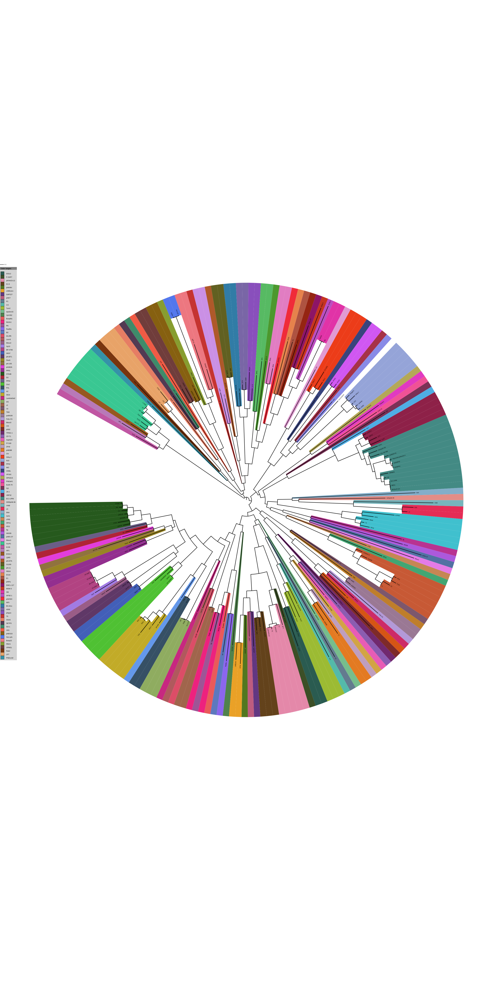

In [56]:
Image("casjens_terminase.40.uclust.pct_gap_max.png", width="800")

It's a rainbow.

So far it looks like clustering is not too useful as most proteins have very little shared identity.  It's a wonder they can all be called Terminases.  

I guess phylogeny is the way to go.

#####Although there is OrthoMCL... could that be better than UCLUST?